# EDA

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from PIL import Image
from scipy.special import boxcox
import os
from os import path
import sklearn 
from sklearn.model_selection import train_test_split
import chart_studio.plotly as py
import plotly.offline as offline
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from plotly.graph_objs import Scatter, Figure, Layout
from plotly import tools

In [2]:
# loading the dataset
customers = pd.read_csv('olist_customers_dataset.csv',dtype={'customer_zip_code_prefix':str})
order_items  =pd.read_csv('olist_order_items_dataset.csv')
orders = pd.read_csv('olist_orders_dataset.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv',dtype={'seller_zip_code_prefix':str})
product = pd.read_csv('olist_products_dataset.csv')
translation = pd.read_csv('product_category_name_translation.csv')
geolocation = pd.read_csv('olist_geolocation_dataset.csv',dtype={'geolocation_zip_code_prefix':str})
reviews = pd.read_csv('olist_order_reviews_dataset.csv')

In [3]:
# merge the dataset based on their id
data = pd.merge(product,
                translation,
                on=['product_category_name'],
               )[['product_id','product_category_name_english','product_category_name']]

In [4]:
data1 = pd.merge(data,
               order_items,
               on=['product_id'],
               )
data1.head(3)

,product_id,product_category_name_english,product_category_name,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,perfumaria,e17e4f88e31525f7deef66779844ddce,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-04-30 17:33:54,10.91,7.39
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,perfumaria,048cc42e03ca8d43c729adf6962cb348,1,7040e82f899a04d1b434b795a43b4617,2017-11-23 21:31:31,16.90,7.78
2,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,perfumaria,5fa78e91b5cb84b6a8ccc42733f95742,1,7040e82f899a04d1b434b795a43b4617,2017-12-14 16:33:14,16.90,7.78


In [5]:
data2 = pd.merge(data1,
                 orders,
                 on=['order_id'])
data2.head(3)

,product_id,product_category_name_english,product_category_name,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,perfumaria,e17e4f88e31525f7deef66779844ddce,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-04-30 17:33:54,10.91,7.39,f8a3e963a310aa58b60a5b1fed5bceb5,delivered,2018-04-24 16:16:53,2018-04-24 19:04:19,2018-04-25 17:01:00,2018-04-27 16:42:17,2018-05-09 00:00:00
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,perfumaria,048cc42e03ca8d43c729adf6962cb348,1,7040e82f899a04d1b434b795a43b4617,2017-11-23 21:31:31,16.90,7.78,12a2c614dfc8926e793516b1638c7471,delivered,2017-11-16 21:28:00,2017-11-17 21:35:39,2017-11-21 22:14:50,2017-11-23 15:39:38,2017-11-29 00:00:00
2,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,perfumaria,5fa78e91b5cb84b6a8ccc42733f95742,1,7040e82f899a04d1b434b795a43b4617,2017-12-14 16:33:14,16.90,7.78,c15eed3881abc9e06763c989679c5094,delivered,2017-11-30 01:51:23,2017-12-08 16:33:14,2017-12-09 00:53:08,2017-12-13 20:52:32,2017-12-18 00:00:00


In [6]:
data3 = pd.merge(data2,
                 reviews[['order_id','review_score']],
                 on=['order_id'])
data3.head(3)

,product_id,product_category_name_english,product_category_name,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,perfumaria,e17e4f88e31525f7deef66779844ddce,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-04-30 17:33:54,10.91,7.39,f8a3e963a310aa58b60a5b1fed5bceb5,delivered,2018-04-24 16:16:53,2018-04-24 19:04:19,2018-04-25 17:01:00,2018-04-27 16:42:17,2018-05-09 00:00:00,5
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,perfumaria,048cc42e03ca8d43c729adf6962cb348,1,7040e82f899a04d1b434b795a43b4617,2017-11-23 21:31:31,16.90,7.78,12a2c614dfc8926e793516b1638c7471,delivered,2017-11-16 21:28:00,2017-11-17 21:35:39,2017-11-21 22:14:50,2017-11-23 15:39:38,2017-11-29 00:00:00,5
2,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,perfumaria,5fa78e91b5cb84b6a8ccc42733f95742,1,7040e82f899a04d1b434b795a43b4617,2017-12-14 16:33:14,16.90,7.78,c15eed3881abc9e06763c989679c5094,delivered,2017-11-30 01:51:23,2017-12-08 16:33:14,2017-12-09 00:53:08,2017-12-13 20:52:32,2017-12-18 00:00:00,2


In [7]:
data4 = pd.merge(data3,
                sellers,
                on=['seller_id']).drop('seller_id',axis=1)
data4.head(3)

,product_id,product_category_name_english,product_category_name,order_id,order_item_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,seller_zip_code_prefix,seller_city,seller_state
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,perfumaria,e17e4f88e31525f7deef66779844ddce,1,2018-04-30 17:33:54,10.91,7.39,f8a3e963a310aa58b60a5b1fed5bceb5,delivered,2018-04-24 16:16:53,2018-04-24 19:04:19,2018-04-25 17:01:00,2018-04-27 16:42:17,2018-05-09 00:00:00,5,03694,sao paulo,SP
1,a035b83b3628decee6e3823924e0c10f,perfumery,perfumaria,b18cb761efbe70da4838435a349abd07,1,2018-07-06 19:31:03,268.38,21.07,9ff6d1a05ecfe2d907adac11a2e2bfe9,delivered,2018-07-04 18:39:28,2018-07-05 16:33:14,2018-07-05 13:21:00,2018-07-10 22:34:39,2018-07-27 00:00:00,4,03694,sao paulo,SP
2,091107484dd7172f5dcfed173e4a960e,perfumery,perfumaria,a7708ffa8966514c098d15e1abfa6417,1,2018-04-27 19:31:35,7.65,10.55,360782688ff472f1adbd47a85861751e,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,2018-04-25 23:02:39,2018-05-15 00:00:00,5,03694,sao paulo,SP


In [8]:
data5 = pd.merge(data4,
                customers,
                on=['customer_id']).drop(['customer_id'],axis=1)
data5.head(3)

,product_id,product_category_name_english,product_category_name,order_id,order_item_id,shipping_limit_date,price,freight_value,order_status,order_purchase_timestamp,...,order_delivered_customer_date,order_estimated_delivery_date,review_score,seller_zip_code_prefix,seller_city,seller_state,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,perfumaria,e17e4f88e31525f7deef66779844ddce,1,2018-04-30 17:33:54,10.91,7.39,delivered,2018-04-24 16:16:53,...,2018-04-27 16:42:17,2018-05-09 00:00:00,5,03694,sao paulo,SP,b1a1199364a4a7fe27c4486ab63f550d,13848,mogi-guacu,SP
1,a035b83b3628decee6e3823924e0c10f,perfumery,perfumaria,b18cb761efbe70da4838435a349abd07,1,2018-07-06 19:31:03,268.38,21.07,delivered,2018-07-04 18:39:28,...,2018-07-10 22:34:39,2018-07-27 00:00:00,4,03694,sao paulo,SP,fc68ba9c34778e17224154c255b5656e,84200,jaguariaiva,PR
2,091107484dd7172f5dcfed173e4a960e,perfumery,perfumaria,a7708ffa8966514c098d15e1abfa6417,1,2018-04-27 19:31:35,7.65,10.55,delivered,2018-04-23 19:03:35,...,2018-04-25 23:02:39,2018-05-15 00:00:00,5,03694,sao paulo,SP,c67329fd07872a68d6d6d1f1626a0760,03804,sao paulo,SP


In [9]:
data6 = data5.drop(['product_id','order_id'],axis=1).rename(columns={'product_category_name_english':'category','order_item_id':'item'})

In [10]:
data6.head()

,category,product_category_name,item,shipping_limit_date,price,freight_value,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,seller_zip_code_prefix,seller_city,seller_state,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,perfumery,perfumaria,1,2018-04-30 17:33:54,10.91,7.39,delivered,2018-04-24 16:16:53,2018-04-24 19:04:19,2018-04-25 17:01:00,2018-04-27 16:42:17,2018-05-09 00:00:00,5,03694,sao paulo,SP,b1a1199364a4a7fe27c4486ab63f550d,13848,mogi-guacu,SP
1,perfumery,perfumaria,1,2018-07-06 19:31:03,268.38,21.07,delivered,2018-07-04 18:39:28,2018-07-05 16:33:14,2018-07-05 13:21:00,2018-07-10 22:34:39,2018-07-27 00:00:00,4,03694,sao paulo,SP,fc68ba9c34778e17224154c255b5656e,84200,jaguariaiva,PR
2,perfumery,perfumaria,1,2018-04-27 19:31:35,7.65,10.55,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,2018-04-25 23:02:39,2018-05-15 00:00:00,5,03694,sao paulo,SP,c67329fd07872a68d6d6d1f1626a0760,03804,sao paulo,SP
3,toys,brinquedos,2,2018-04-27 19:31:35,29.00,10.55,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,2018-04-25 23:02:39,2018-05-15 00:00:00,5,13232,campo limpo paulista,SP,c67329fd07872a68d6d6d1f1626a0760,03804,sao paulo,SP
4,perfumery,perfumaria,1,2018-08-01 16:35:17,268.38,18.07,delivered,2018-07-29 20:50:22,2018-07-30 18:31:13,2018-08-01 15:24:00,2018-08-06 18:36:46,2018-08-15 00:00:00,3,03694,sao paulo,SP,1b6d2664b20a04a1fa9c900aedf29440,71920,brasilia,DF


In [10]:
# convert the data to datetime  
import datetime as dt
data6['shipping_limit_date'] = pd.to_datetime(data6.shipping_limit_date)
data6['order_purchase_timestamp'] = pd.to_datetime(data6.order_purchase_timestamp)
data6['order_approved_at'] = pd.to_datetime(data6.order_approved_at)
data6['order_delivered_carrier_date'] = pd.to_datetime(data6.order_delivered_carrier_date)
data6['order_delivered_customer_date'] = pd.to_datetime(data6.order_delivered_customer_date)
data6['order_estimated_delivery_date'] = pd.to_datetime(data6.order_estimated_delivery_date)


In [11]:
# eliminate the lines without data
olist_data = data6.loc[(data6.order_delivered_carrier_date.notnull())&
          (data6.order_approved_at.notnull())&
         (data6.order_delivered_customer_date.notnull())]

In [12]:
# convert the datetime to days
olist_data['delay'] = olist_data.order_delivered_customer_date - olist_data.order_approved_at
olist_data['delay'] = olist_data.delay.apply(lambda x:x/np.timedelta64(1,'D'))

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
# eliminate the data where delay<0
olist_data = olist_data.loc[olist_data.delay>0]


In [14]:
# add more zip features
olist_data['customer_zip_code_prefix_1_digits'] = olist_data['customer_zip_code_prefix'].str[0:1]
olist_data['customer_zip_code_prefix_2_digits'] = olist_data['customer_zip_code_prefix'].str[0:2]
olist_data['customer_zip_code_prefix_3_digits'] = olist_data['customer_zip_code_prefix'].str[0:3]
olist_data['customer_zip_code_prefix_4_digits'] = olist_data['customer_zip_code_prefix'].str[0:4]
olist_data['seller_zip_code_prefix_1_digits'] = olist_data['seller_zip_code_prefix'].str[0:1]
olist_data['seller_zip_code_prefix_2_digits'] = olist_data['seller_zip_code_prefix'].str[0:2]
olist_data['seller_zip_code_prefix_3_digits'] = olist_data['seller_zip_code_prefix'].str[0:3]
olist_data['seller_zip_code_prefix_4_digits'] = olist_data['seller_zip_code_prefix'].str[0:4]

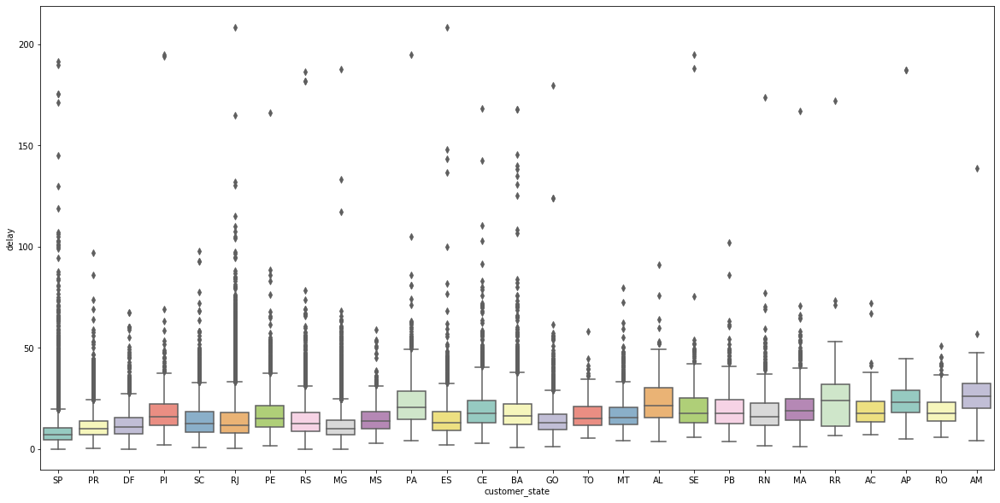

In [15]:
# box plot
fig = plt.figure(figsize=(20,10))
sns.boxplot(x="customer_state", 
            y="delay", 
            data=olist_data, palette="Set3")

In [16]:
# set the upper limitation 
upper_limitation = olist_data.delay.quantile(q=0.99)

In [17]:
# set boundary
def lim_delay(x):
    if x > upper_limitation:
        return upper_limitation
    else:
        return x
olist_data.delay = olist_data.delay.apply(lim_delay)

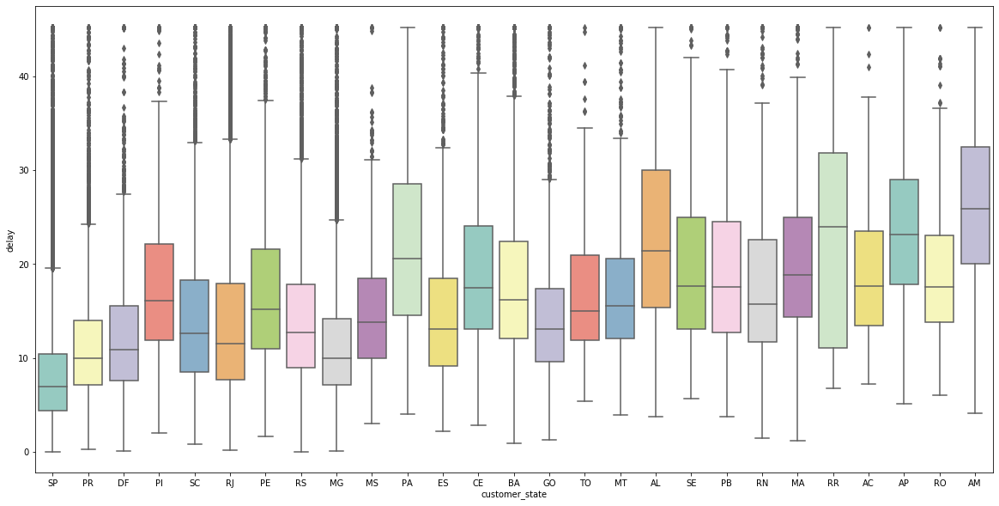

In [194]:
# box plot after setting boundaries
fig = plt.figure(figsize=(20,10))
sns.boxplot(x="customer_state", 
            y="delay", 
            data=olist_data, palette="Set3")

In [20]:
# data cleaning
cor_dict = {'sp / sp':'sao paulo','sao paulo / sao paulo':'sao paulo','sao paulo - sp':'sao paulo',
           'sp':'sao paulo','sao  paulo':'sao paulo'}
olist_data['customer_city'] = olist_data['customer_city'].replace(cor_dict)

In [21]:
# time series analysis fo sp city
spc_data = olist_data.loc[olist_data.customer_city=='sao paulo']
spc_data['revenue'] = spc_data.price * spc_data.item
spc_data.head()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,category,product_category_name,item,shipping_limit_date,price,freight_value,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,delay,customer_zip_code_prefix_1_digits,customer_zip_code_prefix_2_digits,customer_zip_code_prefix_3_digits,customer_zip_code_prefix_4_digits,seller_zip_code_prefix_1_digits,seller_zip_code_prefix_2_digits,seller_zip_code_prefix_3_digits,seller_zip_code_prefix_4_digits,revenue
2,perfumery,perfumaria,1,2018-04-27 19:31:35,7.65,10.55,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,...,1.156181,0,03,038,0380,0,03,036,0369,7.65
3,toys,brinquedos,2,2018-04-27 19:31:35,29.00,10.55,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,...,1.156181,0,03,038,0380,1,13,132,1323,58.00
5,perfumery,perfumaria,1,2018-06-20 21:58:24,16.88,7.39,delivered,2018-06-18 21:46:34,2018-06-18 21:58:24,2018-06-19 15:10:00,...,1.891563,0,04,045,0456,0,03,036,0369,16.88
24,perfumery,perfumaria,1,2017-12-14 16:33:14,16.90,7.78,delivered,2017-11-30 01:51:23,2017-12-08 16:33:14,2017-12-09 00:53:08,...,5.180069,0,05,058,0589,0,01,010,0102,16.90
25,perfumery,perfumaria,1,2017-11-29 19:19:47,49.90,7.78,delivered,2017-11-23 19:09:19,2017-11-23 19:19:47,2017-11-24 21:34:56,...,2.869525,0,03,031,0319,0,01,010,0102,49.90


In [22]:
daily_sales = spc_data.groupby('order_purchase_timestamp', as_index=False)['revenue'].sum()
# store_daily_sales = df_train.groupby(['store', 'date'], as_index=False)['sales'].sum()
# item_daily_sales = df_train.groupby(['item', 'date'], as_index=False)['sales'].sum()

daily_sales.head()

,order_purchase_timestamp,revenue
0,2016-10-03 09:44:50,29.90
1,2016-10-04 09:16:33,32.49
2,2016-10-04 09:59:03,89.90
3,2016-10-04 12:53:17,9.90
4,2016-10-04 15:12:18,69.99


In [23]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

In [24]:
daily_sales_sc = go.Scatter(x=daily_sales['order_purchase_timestamp'], y=daily_sales['revenue'])
layout = go.Layout(title='Daily sales(sao paulo )', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

# Map

In [25]:
geolocation.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,01037,-23.545621,-46.639292,sao paulo,SP
1,01046,-23.546081,-46.644820,sao paulo,SP
2,01046,-23.546129,-46.642951,sao paulo,SP


In [26]:
geolocation['geolocation_zip_code_prefix_2_digits'] = geolocation['geolocation_zip_code_prefix'].str[0:2]
geolocation['geolocation_zip_code_prefix_3_digits'] = geolocation['geolocation_zip_code_prefix'].str[0:3]

In [27]:
# Removing some outliers
#Brazils most Northern spot is at 5 deg 16′ 27.8″ N latitude.;
geolocation = geolocation.loc[geolocation.geolocation_lat <= 5.27438888]
#it’s most Western spot is at 73 deg, 58′ 58.19″W Long.
geolocation = geolocation.loc[geolocation.geolocation_lng >= -73.98283055]
#It’s most southern spot is at 33 deg, 45′ 04.21″ S Latitude.
geolocation = geolocation.loc[geolocation.geolocation_lat >= -33.75116944]
#It’s most Eastern spot is 34 deg, 47′ 35.33″ W Long.
geolocation = geolocation.loc[geolocation.geolocation_lng <=  -34.79314722]


In [28]:
# treat the latitute and longitude coordinates and transform then to Mercator x/y Coordinates.
from datashader.utils import lnglat_to_meters as webm
X,y = webm(geolocation.geolocation_lng,geolocation.geolocation_lat)
geolocation['X'] = pd.Series(X)
geolocation['y'] = pd.Series(y)

In [29]:
geo_group = geolocation.groupby('geolocation_zip_code_prefix',as_index=False).mean()
geo_group.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,X,y
0,01001,-23.550190,-46.634024,-5.191276e+06,-2.698692e+06
1,01002,-23.548146,-46.634979,-5.191382e+06,-2.698444e+06
2,01003,-23.548994,-46.635731,-5.191466e+06,-2.698547e+06


In [30]:
olist_geo1 = pd.merge(geo_group,
                    olist_data,
                    left_on='geolocation_zip_code_prefix',
                    right_on='customer_zip_code_prefix')

In [31]:
olist_geo = pd.merge(geo_group,
                    olist_geo1,
                    left_on='geolocation_zip_code_prefix',
                    right_on='seller_zip_code_prefix')
olist_geo.rename(columns={'geolocation_zip_code_prefix_x':'geolocation_zip_code_prefix_customer',
                         'geolocation_lat_x':'geolocation_lat_customer',
                         'geolocation_lng_x':'geolocation_lng_customer',
                         'X_x':'X_customer','y_x':'Y_customer',
                         'geolocation_zip_code_prefix_y':'geolocation_zip_code_prefix_seller',
                         'geolocation_lat_y':'geolocation_lat_seller',
                         'geolocation_lng_y':'geolocation_lng_seller',
                         'X_y':'X_seller','y_y':'Y_seller'},inplace=True)


In [32]:
brazil_geo = geolocation.set_index('geolocation_zip_code_prefix_3_digits').copy()


Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
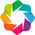

In [33]:
# plot wtih holoviews + datashader - bokeh with map background
import holoviews as hv
import geoviews as gv
import geoviews.tile_sources as gvts
import datashader as ds
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr
from datashader.colors import colormap_select, Greys9
from holoviews.streams import RangeXY
from holoviews.operation.datashader import datashade, dynspread, rasterize
from bokeh.io import push_notebook, show, output_notebook
output_notebook()
hv.extension('bokeh')

%opts Overlay [width=800 height=600 toolbar='above' xaxis=None yaxis=None]
%opts QuadMesh [tools=['hover'] colorbar=True] (alpha=0 hover_alpha=0.2)

T = 0.05
PX = 1

def plot_map(data, label, agg_data, agg_name, cmap):
    geomap = gvts.CartoDark
    points = hv.Points(gv.Dataset(data, kdims=['X', 'y'], vdims=[agg_name]))
    agg = datashade(points, element_type=gv.Image, aggregator=agg_data, cmap=cmap)
    zip_codes = dynspread(agg, threshold=T, max_px=PX)
    hover = hv.util.Dynamic(rasterize(points, aggregator=agg_data, width=50, height=25, streams=[RangeXY]), operation=hv.QuadMesh)
    hover = hover.options(cmap=cmap)
    img = geomap * zip_codes * hover
    img = img.relabel(label)
    return img

In [34]:
# plot the average lead time of sellers
gp = olist_geo.groupby('seller_zip_code_prefix_3_digits')['delay'].mean().to_frame()
lead_time = brazil_geo.join(gp)
agg_name = 'avg_lead_time'
lead_time[agg_name] = lead_time['delay']

In [35]:
plot_map(lead_time,
         'Orders Average Lead Time (Seller)',
         ds.mean(agg_name), 
         agg_name, 
         cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [X,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [X,y]   (avg_lead_time)

In [36]:
# # plot the order frequency of sellers
gp_frequency = olist_geo.groupby('seller_zip_code_prefix_3_digits')['item'].sum().to_frame()
frequency = brazil_geo.join(gp_frequency)
agg_name = 'frequency'
frequency[agg_name] = frequency['item']

In [37]:
plot_map(frequency,
         'Order frequency (Seller)',
         ds.mean(agg_name), 
         agg_name, 
         cmap=fire)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [X,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [X,y]   (frequency)

In [38]:
# plot the average lead time of customers
c_gp = olist_geo.groupby('customer_zip_code_prefix_3_digits')['delay'].mean().to_frame()
c_lead_time = brazil_geo.join(c_gp)
agg_name = 'avg_lead_time'
c_lead_time[agg_name] = c_lead_time['delay']

In [39]:
plot_map(c_lead_time,
         'Orders Average Lead Time (Customer)',
         ds.mean(agg_name), 
         agg_name, 
         cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [X,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [X,y]   (avg_lead_time)

In [40]:
# # plot the order frequency of customers
c_gp_frequency = olist_geo.groupby('customer_zip_code_prefix_3_digits')['item'].sum().to_frame()
frequency = brazil_geo.join(c_gp_frequency)
agg_name = 'frequency'
frequency[agg_name] = frequency['item']

In [41]:
plot_map(frequency,
         'Order frequency (Customer)',
         ds.mean(agg_name), 
         agg_name, 
         cmap=fire)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [X,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [X,y]   (frequency)

In [42]:
olist_geo['revenue'] = olist_geo.item * olist_geo.price

In [43]:
# plot the order revenue of sellers
revenue_gp = olist_geo.groupby('customer_zip_code_prefix_3_digits')['revenue'].sum().to_frame()
revenue = brazil_geo.join(revenue_gp)
agg_name = 'revenue'
frequency[agg_name] = revenue['revenue']

In [44]:
plot_map(revenue,
         'Order revenue (Seller)',
         ds.mean(agg_name), 
         agg_name, 
         cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [X,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [X,y]   (revenue)

# network

In [46]:
gephi_data = olist_geo[['seller_state','customer_state',
                        'geolocation_lat_customer','geolocation_lng_customer',
                     'geolocation_lat_seller','geolocation_lng_seller','category',
                     'item','freight_value','delay']]
gephi_data.head(3)

,seller_state,customer_state,geolocation_lat_customer,geolocation_lng_customer,geolocation_lat_seller,geolocation_lng_seller,category,item,freight_value,delay
0,SP,SP,-23.55019,-46.634024,-23.458835,-46.722111,fashion_bags_accessories,1,7.78,1.716100
1,SP,SP,-23.55019,-46.634024,-23.458835,-46.722111,fashion_bags_accessories,2,7.78,1.716100
2,SP,SP,-23.55019,-46.634024,-23.538137,-46.676788,fashion_bags_accessories,1,7.78,11.139525


In [47]:
gephi_data.rename(columns={'geolocation_lat_customer':'customer_lat','geolocation_lng_customer':'customer_lng',
                         'geolocation_lat_seller':'seller_lat','geolocation_lng_seller':'seller_lng',
                         'delay':'leadtime'},inplace=True)

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [48]:
# create node list
seller_node = list(gephi_data.seller_state.unique())
customer_node = list(gephi_data.customer_state.unique())
node_list = list(set(seller_node+customer_node))
node_list_data = pd.DataFrame()
node_list_data['ID'] = node_list
node_list_data['label'] = node_list


In [49]:
a_data = pd.DataFrame({'frequency': gephi_data.groupby(['seller_state'])['item'].sum()}).reset_index()
b_data = pd.DataFrame({'frequency': gephi_data.groupby(['customer_state'])['item'].sum()}).reset_index()

In [50]:
for idx, row in node_list_data.iterrows():
    state = row['ID']
    tmp1 = a_data[a_data['seller_state'] == state]
    tmp2 = b_data[b_data['customer_state'] == state]
    if len(tmp1) > 0:
        node_list_data.loc[idx, 'sent'] = tmp1['frequency'].values[0]
    if len(tmp2) > 0:
        node_list_data.loc[idx,'recived'] = tmp2['frequency'].values[0]

In [51]:
node_list_data.fillna(0,inplace=True)
node_list_data.head(3)

,ID,label,sent,recived
0,RO,RO,15.0,307.0
1,AP,AP,0.0,102.0
2,DF,DF,948.0,2552.0


In [52]:
# define the distance between two states
import math

def haversine(lat1,lon1,lat2,lon2):
    R = 6371  # Earth radius in kilometers

    
    phi1, phi2 = math.radians(lat1), math.radians(lat2) 
    dphi       = math.radians(lat2 - lat1)
    dlambda    = math.radians(lon2 - lon1)
    
    a = math.sin(dphi/2)**2 + math.cos(phi1)*math.cos(phi2)*math.sin(dlambda/2)**2
    
    return 2*R*math.atan2(math.sqrt(a), math.sqrt(1 - a))

In [53]:
gephi_data['phy_dist'] = gephi_data.apply(lambda row: haversine(row.customer_lat,
                                                              row.customer_lng,
                                                              row.seller_lat,
                                                              row.seller_lng),axis=1)
gephi_data.drop(['customer_lat','customer_lng',
               'seller_lat','seller_lng'],
              inplace=True, axis=1)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [55]:
# create edge list
gephi_group = gephi_data.groupby(['seller_state','customer_state'],as_index=False).agg({'item':'sum',
                        'freight_value':'mean',
                        'leadtime':'mean',
                        'phy_dist':'mean'}).rename(columns={'item':'frequency'})
gephi_group['inv_leadtime'] = 1 / gephi_group.leadtime
gephi_group['inv_phy_dist'] = 1000 / gephi_group.phy_dist
gephi_group.head(3)

,seller_state,customer_state,frequency,freight_value,leadtime,phy_dist,inv_leadtime,inv_phy_dist
0,AM,AL,1,35.26,45.240775,2772.863516,0.022104,0.360638
1,AM,MA,1,21.25,29.523484,1659.811045,0.033871,0.602478
2,AM,MG,1,25.29,23.037928,2549.381453,0.043407,0.392252


In [56]:
gephi_group.to_csv('edge_list.csv')

In [57]:
gephi_group.head(3)

,seller_state,customer_state,frequency,freight_value,leadtime,phy_dist,inv_leadtime,inv_phy_dist
0,AM,AL,1,35.26,45.240775,2772.863516,0.022104,0.360638
1,AM,MA,1,21.25,29.523484,1659.811045,0.033871,0.602478
2,AM,MG,1,25.29,23.037928,2549.381453,0.043407,0.392252


In [58]:
# create network with networkx
import networkx as nx
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [59]:
G = nx.DiGraph()
for i, row in gephi_group.iterrows():
    G.add_edge(row['seller_state'],
              row['customer_state'],
#               attr_dict=row[['frequency','inv_leadtime','inv_phy_dist']].to_dict(),
              frequency=row['frequency'],
              inv_leadtime=row['inv_leadtime'],
              inv_phy_dist=row['inv_phy_dist'])
    

In [61]:
gephi_data['efficiency'] = gephi_data.phy_dist / gephi_data.leadtime

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
olist_geo.head(3)

,geolocation_zip_code_prefix_customer,geolocation_lat_customer,geolocation_lng_customer,X_customer,Y_customer,geolocation_zip_code_prefix_seller,geolocation_lat_seller,geolocation_lng_seller,X_seller,Y_seller,...,delay,customer_zip_code_prefix_1_digits,customer_zip_code_prefix_2_digits,customer_zip_code_prefix_3_digits,customer_zip_code_prefix_4_digits,seller_zip_code_prefix_1_digits,seller_zip_code_prefix_2_digits,seller_zip_code_prefix_3_digits,seller_zip_code_prefix_4_digits,revenue
0,01001,-23.55019,-46.634024,-5.191276e+06,-2.698692e+06,02938,-23.458835,-46.722111,-5.201082e+06,-2.687602e+06,...,1.716100,0,02,029,0293,0,01,010,0100,45.0
1,01001,-23.55019,-46.634024,-5.191276e+06,-2.698692e+06,02938,-23.458835,-46.722111,-5.201082e+06,-2.687602e+06,...,1.716100,0,02,029,0293,0,01,010,0100,90.0
2,01001,-23.55019,-46.634024,-5.191276e+06,-2.698692e+06,05016,-23.538137,-46.676788,-5.196036e+06,-2.697228e+06,...,11.139525,0,05,050,0501,0,01,010,0100,35.0


In [63]:
# calculate the Eigenvector centralities
ec = nx.eigenvector_centrality_numpy(G,weight='frequency')
# calculate the outdegree centralities
oc = nx.out_degree_centrality(G)
# calculate the indegree centralities
ic = nx.in_degree_centrality(G)

In [64]:
node_list_data['eigenvector_centrality'] = node_list_data.label.map(ec)
node_list_data['out_degree_centrality'] = node_list_data.label.map(oc)
node_list_data['in_degree_centrality'] = node_list_data.label.map(ic)


In [65]:
# Set this as a node attribute for each node
nx.set_node_attributes(G, name='cent', values=ec)
nx.set_node_attributes(G, name='oc', values=oc)
nx.set_node_attributes(G, name='ic', values=ic)



In [66]:
# plt.rcParams['figure.figsize'] = [12, 12]

In [67]:
# Blank dictionary to store total exports
totexp = {}

# Calculate total exports of each country in the network
for exp in G.nodes(): 
    tx=sum([float(g) for exp,f,g in G.out_edges(exp, 'frequency')])
    totexp[exp] = tx
avgexp = np.mean([totexp[exp] for exp in totexp])
nx.set_node_attributes(G, name='totexp', values=totexp)

# Use the results later for the node's size in the graph
node_size = [(float(G.node[v]['totexp'])) for v in G] 

In [189]:
def plot_netw(cent_t):
    pos = nx.spring_layout(G,k=30,iterations=8) 
    node_color = [float(G.node[v][cent_t]) for v in G]

    nodes = nx.draw_networkx_nodes(G,pos, node_size=node_size,
                                   node_color=node_color, alpha=0.5) 

    edges = nx.draw_networkx_edges(G, pos, edge_color='black', 
                                   arrows=False, width=0.08,)

    # Add labels
    nx.draw_networkx_labels(G,pos,font_size=15)
    nodes.set_edgecolor('grey')


    # Bar with color scale for eigenvalues
    cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
    cbar.set_clim(0, 1)

    plt.rcParams['figure.figsize'] = [10, 10]
    # plt.figure(figsize=(10,5))
    plt.axis('off')
    plt.margins(0,0)

    plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off')
    plt.show()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning:


The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.



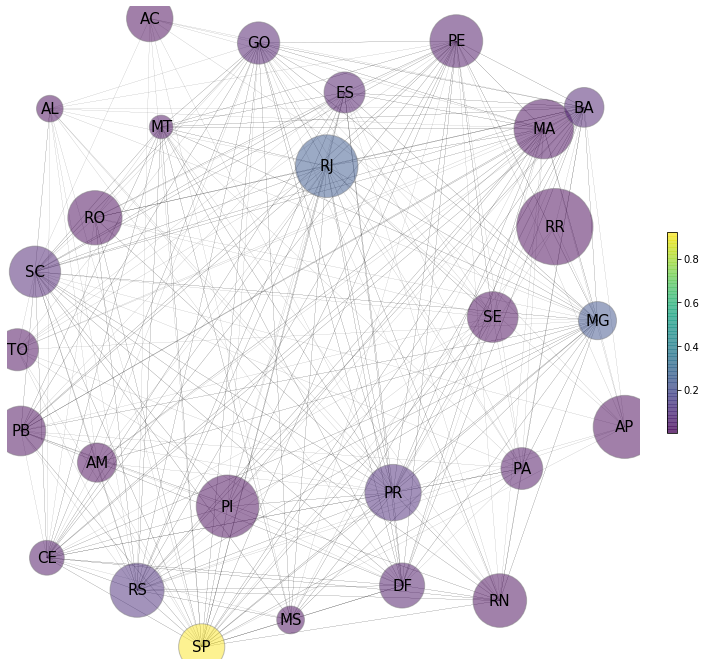

In [190]:
plot_netw('cent')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning:


The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.



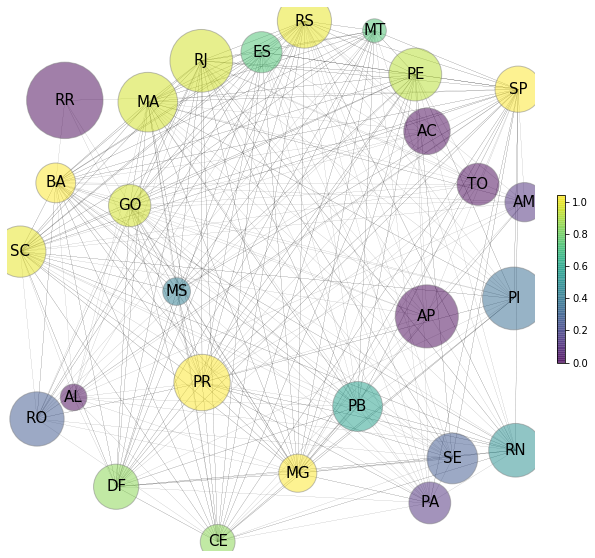

In [193]:
plot_netw('oc')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning:


The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.



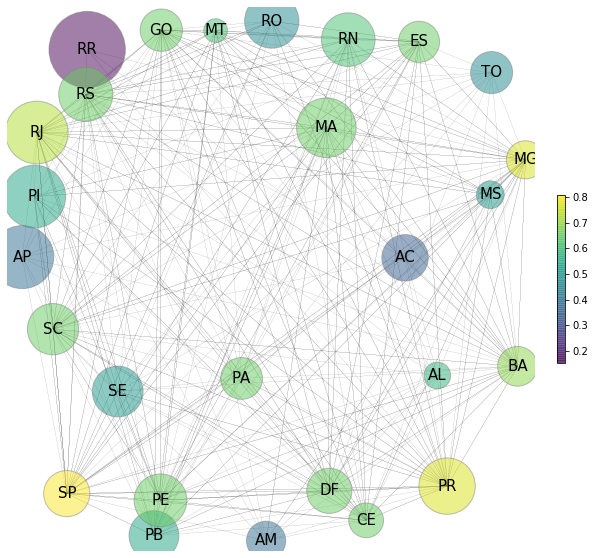

In [192]:
plot_netw('ic')

In [72]:
# narronw down the areas to sao paulo State 
sp_data = olist_geo.loc[(olist_geo['seller_state']=='SP')&(olist_geo['customer_state']=='SP')]
sp_data = sp_data[['item','freight_value','delay','seller_city','customer_city',
                  'geolocation_lat_customer','geolocation_lng_customer',
                  'geolocation_lat_seller','geolocation_lng_seller','category', 
                   'seller_zip_code_prefix_3_digits','customer_zip_code_prefix_3_digits']]
sp_data.head(3)

,item,freight_value,delay,seller_city,customer_city,geolocation_lat_customer,geolocation_lng_customer,geolocation_lat_seller,geolocation_lng_seller,category,seller_zip_code_prefix_3_digits,customer_zip_code_prefix_3_digits
0,1,7.78,1.716100,sao paulo,sao paulo,-23.55019,-46.634024,-23.458835,-46.722111,fashion_bags_accessories,010,029
1,2,7.78,1.716100,sao paulo,sao paulo,-23.55019,-46.634024,-23.458835,-46.722111,fashion_bags_accessories,010,029
2,1,7.78,11.139525,sao paulo,sao paulo,-23.55019,-46.634024,-23.538137,-46.676788,fashion_bags_accessories,010,050


In [73]:
sp_data = sp_data.astype({'seller_zip_code_prefix_3_digits':'str',
                         'customer_zip_code_prefix_3_digits':'str'})


In [74]:
olist_data.head()

,category,product_category_name,item,shipping_limit_date,price,freight_value,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,customer_state,delay,customer_zip_code_prefix_1_digits,customer_zip_code_prefix_2_digits,customer_zip_code_prefix_3_digits,customer_zip_code_prefix_4_digits,seller_zip_code_prefix_1_digits,seller_zip_code_prefix_2_digits,seller_zip_code_prefix_3_digits,seller_zip_code_prefix_4_digits
0,perfumery,perfumaria,1,2018-04-30 17:33:54,10.91,7.39,delivered,2018-04-24 16:16:53,2018-04-24 19:04:19,2018-04-25 17:01:00,...,SP,2.901366,1,13,138,1384,0,03,036,0369
1,perfumery,perfumaria,1,2018-07-06 19:31:03,268.38,21.07,delivered,2018-07-04 18:39:28,2018-07-05 16:33:14,2018-07-05 13:21:00,...,PR,5.250984,8,84,842,8420,0,03,036,0369
2,perfumery,perfumaria,1,2018-04-27 19:31:35,7.65,10.55,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,...,SP,1.156181,0,03,038,0380,0,03,036,0369
3,toys,brinquedos,2,2018-04-27 19:31:35,29.00,10.55,delivered,2018-04-23 19:03:35,2018-04-24 19:17:45,2018-04-24 16:22:36,...,SP,1.156181,0,03,038,0380,1,13,132,1323
4,perfumery,perfumaria,1,2018-08-01 16:35:17,268.38,18.07,delivered,2018-07-29 20:50:22,2018-07-30 18:31:13,2018-08-01 15:24:00,...,DF,7.003854,7,71,719,7192,0,03,036,0369


In [75]:
# data cleaning
cor_dict = {'sp / sp':'sao paulo','sao paulo / sao paulo':'sao paulo','sao paulo - sp':'sao paulo',
           'sp':'sao paulo','sao  paulo':'sao paulo'}
sp_data['seller_city'] = sp_data['seller_city'].replace(cor_dict)

In [76]:
sp_data.head()

,item,freight_value,delay,seller_city,customer_city,geolocation_lat_customer,geolocation_lng_customer,geolocation_lat_seller,geolocation_lng_seller,category,seller_zip_code_prefix_3_digits,customer_zip_code_prefix_3_digits
0,1,7.78,1.716100,sao paulo,sao paulo,-23.55019,-46.634024,-23.458835,-46.722111,fashion_bags_accessories,010,029
1,2,7.78,1.716100,sao paulo,sao paulo,-23.55019,-46.634024,-23.458835,-46.722111,fashion_bags_accessories,010,029
2,1,7.78,11.139525,sao paulo,sao paulo,-23.55019,-46.634024,-23.538137,-46.676788,fashion_bags_accessories,010,050
3,2,7.78,11.139525,sao paulo,sao paulo,-23.55019,-46.634024,-23.538137,-46.676788,fashion_bags_accessories,010,050
4,1,7.78,7.159803,sao paulo,sao paulo,-23.55019,-46.634024,-23.661961,-46.735784,fashion_bags_accessories,010,058


In [77]:
sp_data['phy_dist'] = sp_data.apply(lambda row: haversine(row.geolocation_lat_customer,
                                                              row.geolocation_lng_customer,
                                                              row.geolocation_lat_seller,
                                                              row.geolocation_lng_seller),axis=1)
sp_data.drop(['geolocation_lat_customer','geolocation_lng_customer',
               'geolocation_lat_seller','geolocation_lng_seller'],
              inplace=True, axis=1)

In [78]:
sp_data = sp_data.loc[sp_data.phy_dist!=0]

In [79]:
sp_data['efficiency'] = sp_data.delay / sp_data.phy_dist

In [80]:
# create node list for zip
sp_seller_node = list(sp_data.seller_city.unique())
sp_customer_node = list(sp_data.customer_city.unique())
sp_node = list(set(sp_seller_node + sp_customer_node))
sp_node_list = pd.DataFrame()
sp_node_list['ID'] = sp_node
sp_node_list['label'] = sp_node
len(sp_node)

634

In [81]:
s_data = pd.DataFrame({'frequency': sp_data.groupby(['seller_city'])['item'].sum()}).reset_index()
r_data = pd.DataFrame({'frequency': sp_data.groupby(['customer_city'])['item'].sum()}).reset_index()
s_data.head(3)

,seller_city,frequency
0,alambari,2
1,alvares machado,3
2,americana,69


In [82]:
for idx, row in sp_node_list.iterrows():
    state = row['ID']
    tmp1 = s_data[s_data['seller_city'] == state]
    tmp2 = r_data[r_data['customer_city'] == state]
    if len(tmp1) > 0:
        sp_node_list.loc[idx, 'sent'] = tmp1['frequency'].values[0]
    if len(tmp2) > 0:
        sp_node_list.loc[idx,'recived'] = tmp2['frequency'].values[0]

In [83]:
sp_node_list.fillna(0,inplace=True)

In [84]:
sp_node_list['freight_flow'] = sp_node_list.sent + sp_node_list.recived

In [85]:
sp_node_list.to_csv('sp_node_list.csv')

In [86]:
sp_edge = sp_data.groupby(['seller_city','customer_city'],as_index=False).agg({'item':'sum',
                                                                                'freight_value':'mean',
                                                                                'delay':'mean',
                                                                                'phy_dist':'mean',
                                                                               'efficiency':'mean'}).rename(columns={'item':'frequency'})

In [87]:
sp_edge.to_csv('sp_edge.csv')

# zoom in our focus areas

In [89]:
# narronw down the areas to sao paulo city 
sp_zip_data = sp_data.loc[(sp_data['seller_city']=='sao paulo')&(sp_data['customer_city']=='sao paulo')]
sp_zip_data.head(3)

,item,freight_value,delay,seller_city,customer_city,category,seller_zip_code_prefix_3_digits,customer_zip_code_prefix_3_digits,phy_dist,efficiency
0,1,7.78,1.716100,sao paulo,sao paulo,fashion_bags_accessories,010,029,13.559770,0.126558
1,2,7.78,1.716100,sao paulo,sao paulo,fashion_bags_accessories,010,029,13.559770,0.126558
2,1,7.78,11.139525,sao paulo,sao paulo,fashion_bags_accessories,010,050,4.560727,2.442489


In [91]:
zip_list = geolocation.loc[geolocation.geolocation_city=='sao paulo'].geolocation_zip_code_prefix_3_digits.unique()

In [93]:
sp_zip_data = sp_zip_data.loc[(sp_zip_data.seller_zip_code_prefix_3_digits.isin(zip_list))&
                             (sp_zip_data.customer_zip_code_prefix_3_digits.isin(zip_list))]

In [95]:
# create node list for zip
sp_zip_seller_node = list(sp_zip_data.seller_zip_code_prefix_3_digits.unique())
sp_zip_customer_node = list(sp_zip_data.customer_zip_code_prefix_3_digits.unique())
sp_zip_node = list(set(sp_zip_seller_node + sp_zip_customer_node))
sp_zip_node_list = pd.DataFrame()
sp_zip_node_list['ID'] = sp_zip_node
sp_zip_node_list['label'] = sp_zip_node
len(sp_zip_customer_node)

50

In [96]:
# count the freight frequency
s_zip_data = pd.DataFrame({'frequency': sp_zip_data.groupby(['seller_zip_code_prefix_3_digits'])['item'].sum()}).reset_index()
r_zip_data = pd.DataFrame({'frequency': sp_zip_data.groupby(['customer_zip_code_prefix_3_digits'])['item'].sum()}).reset_index()

In [97]:
# add attributes to zip nodes

for idx, row in sp_zip_node_list.iterrows():
    state = row['ID']
    tmp1 = s_zip_data[s_zip_data['seller_zip_code_prefix_3_digits'] == state]
    tmp2 = r_zip_data[r_zip_data['customer_zip_code_prefix_3_digits'] == state]
    if len(tmp1) > 0:
        sp_zip_node_list.loc[idx, 'sent'] = tmp1['frequency'].values[0]
    if len(tmp2) > 0:
        sp_zip_node_list.loc[idx,'recived'] = tmp2['frequency'].values[0]

In [98]:
# fill NAN with 0
sp_zip_node_list.fillna(0,inplace=True)
sp_zip_node_list['freight_flow'] = sp_zip_node_list.sent + sp_zip_node_list.recived

In [99]:
# sp_zip_node_list = sp_zip_node_list.loc[sp_zip_node_list.freight_flow>sp_zip_node_list.freight_flow.quantile(q=0.5)]
sp_zip_node_list.describe()

,sent,recived,freight_flow
count,50.00000,50.000000,50.000000
mean,115.00000,115.000000,230.000000
std,113.60332,64.418276,143.767386
min,0.00000,34.000000,46.000000
25%,23.75000,68.750000,137.500000
50%,78.50000,105.000000,199.500000
75%,164.00000,132.250000,286.250000
max,401.00000,387.000000,788.000000


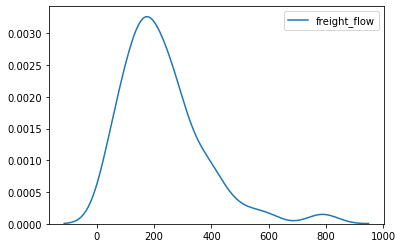

In [100]:
sns.kdeplot(data=sp_zip_node_list.freight_flow)
# plt.rcParams['figure.figsize'] = [5, 5]


In [101]:
sp_zip_node_list.to_csv('sp_zip_node_list.csv')

In [102]:
sp_zip_edge = sp_zip_data.groupby(['seller_zip_code_prefix_3_digits','customer_zip_code_prefix_3_digits'],as_index=False).agg({'item':'sum',
                                                                                'freight_value':'mean',
                                                                                'delay':'mean',
                                                                                'phy_dist':'mean',
                                                                               'efficiency':'mean'}).rename(columns={'item':'frequency'})

In [103]:
sp_zip_edge.sort_values(by='frequency',ascending=False).head()

,seller_zip_code_prefix_3_digits,customer_zip_code_prefix_3_digits,frequency,freight_value,delay,phy_dist,efficiency
788,038,058,238,8.788519,12.007503,37.725788,0.313846
176,020,037,78,7.390000,2.252593,10.562891,0.213255
585,033,080,44,11.757857,7.741271,14.596594,0.525922
188,020,050,36,9.544500,4.098497,7.875758,0.541931
524,032,040,28,21.819167,3.662594,9.179337,0.397009


In [104]:
sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits=='058')&
                (sp_zip_edge.customer_zip_code_prefix_3_digits=='038')]

,seller_zip_code_prefix_3_digits,customer_zip_code_prefix_3_digits,frequency,freight_value,delay,phy_dist,efficiency
1343,058,038,8,7.54625,3.68648,32.343031,0.113305


In [105]:
sp_zip_edge.to_csv('sp_zip_edge.csv')

In [106]:
G_zip = nx.Graph()
for i, row in sp_zip_edge.iterrows():
    G_zip.add_edge(row['seller_zip_code_prefix_3_digits'],
              row['customer_zip_code_prefix_3_digits'],
#               attr_dict=row[['frequency','inv_leadtime','inv_phy_dist']].to_dict(),
              frequency=row['frequency'],
              efficiency=row['efficiency']
              )

In [107]:
G_zip = G_zip.to_undirected()

In [108]:
# clustering the network using best_partition
import community
part = community.best_partition(G_zip,weight='frequency',random_state=1)

In [110]:
ff_flow_dict = sp_zip_node_list.set_index('ID')['freight_flow'].to_dict()

In [111]:
nx.set_node_attributes(G_zip, name='ff', values=ff_flow_dict)
nx.set_node_attributes(G_zip, name='pt', values=part)

In [112]:

plt.rcParams['figure.figsize'] = [15, 15]


/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning:


The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.



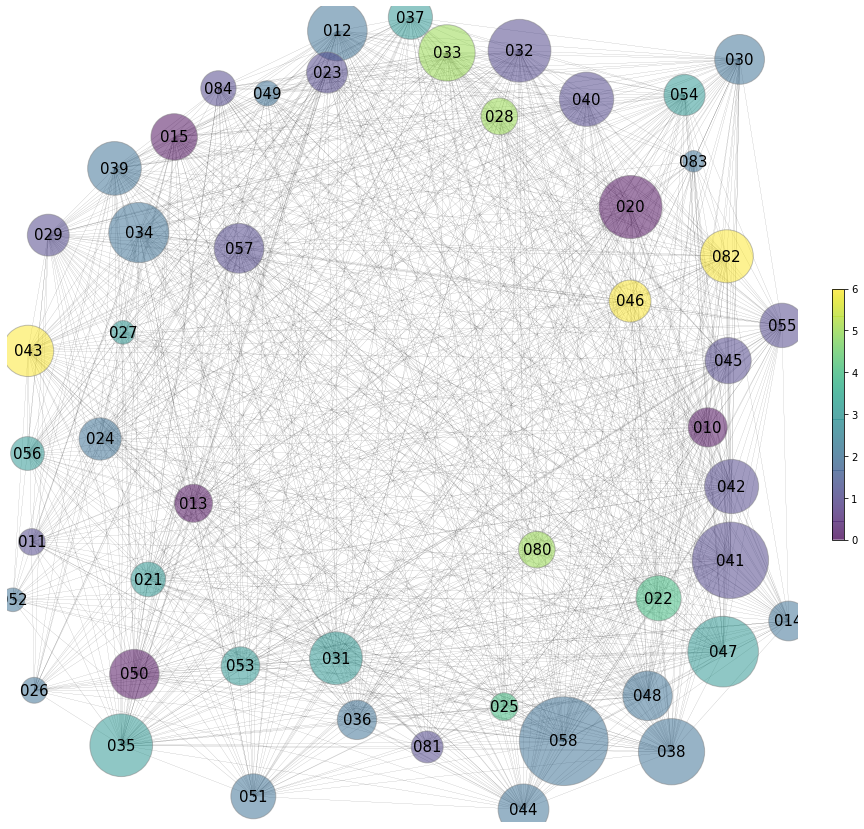

In [113]:
# def plot_netw(cent_t):
pos = nx.spring_layout(G_zip,k=30,iterations=8) 
node_color = [float(G_zip.node[v]['pt']) for v in G_zip]
node_size = [(float(G_zip.node[v]['ff'])*10) for v in G_zip] 
nodes = nx.draw_networkx_nodes(G_zip,pos, node_size=node_size,
                               node_color=node_color, alpha=0.5) 

edges = nx.draw_networkx_edges(G_zip, pos, edge_color='black', 
                               arrows=False, width=0.08,)

# Add labels
nx.draw_networkx_labels(G_zip,pos,font_size=15)
nodes.set_edgecolor('grey')


# Bar with color scale for eigenvalues
cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
cbar.set_clim(0, 1)

# plt.rcParams['figure.figsize'] = [15, 15]
# plt.figure(figsize=(10,5))
plt.axis('off')
plt.margins(0,0)

plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off')
plt.show()

In [114]:
sp_zip_node_list['community'] = sp_zip_node_list.ID.map(part)

In [115]:
sp_zip_node_list.head(3)

,ID,label,sent,recived,freight_flow,community
0,058,058,401.0,387.0,788.0,2
1,015,015,112.0,104.0,216.0,0
2,022,022,110.0,94.0,204.0,4


In [116]:
list0 = list(sp_zip_node_list.loc[sp_zip_node_list.community==0].ID.unique())
list1 = list(sp_zip_node_list.loc[sp_zip_node_list.community==1].ID.unique())
list2 = list(sp_zip_node_list.loc[sp_zip_node_list.community==2].ID.unique())
list3 = list(sp_zip_node_list.loc[sp_zip_node_list.community==3].ID.unique())
list4 = list(sp_zip_node_list.loc[sp_zip_node_list.community==4].ID.unique())
list5 = list(sp_zip_node_list.loc[sp_zip_node_list.community==5].ID.unique())
list6 = list(sp_zip_node_list.loc[sp_zip_node_list.community==6].ID.unique())



In [117]:
sp_zip_edge.head()

,seller_zip_code_prefix_3_digits,customer_zip_code_prefix_3_digits,frequency,freight_value,delay,phy_dist,efficiency
0,010,011,1,7.7800,10.051736,1.261207,7.969935
1,010,012,2,7.3900,3.465110,3.684167,1.233191
2,010,013,1,7.7800,4.725532,3.230349,1.462855
3,010,014,2,7.7800,5.967112,3.819662,1.549652
4,010,015,7,7.7225,3.070124,2.526744,1.244116


In [118]:
effi0 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list0))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list0))].efficiency.mean()
effi1 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list1))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list1))].efficiency.mean()
effi2 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list2))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list2))].efficiency.mean()
effi3 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list3))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list3))].efficiency.mean()
effi4 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list4))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list4))].efficiency.mean()
effi5 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list5))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list5))].efficiency.mean()
effi6 = sp_zip_edge.loc[(sp_zip_edge.seller_zip_code_prefix_3_digits.isin(list6))&
               (sp_zip_edge.customer_zip_code_prefix_3_digits.isin(list6))].efficiency.mean()

In [119]:
effi_data = pd.Series({0:effi0, 1:effi1, 2:effi2, 3:effi3, 4:effi5, 5:effi6, 6:effi6})

In [121]:
community_data = sp_zip_node_list.groupby('community',as_index=False).sum()
community_data['efficiency'] = effi_data
community_data

,community,sent,recived,freight_flow,efficiency
0,0,578.0,581.0,1159.0,1.681441
1,1,1345.0,1521.0,2866.0,0.751739
2,2,2121.0,1788.0,3909.0,0.671854
3,3,1008.0,969.0,1977.0,1.262726
4,4,125.0,156.0,281.0,0.476203
5,5,249.0,338.0,587.0,1.996830
6,6,324.0,397.0,721.0,1.996830


In [122]:
# data cleaning
cor_dict = {'sp / sp':'sao paulo','sao paulo / sao paulo':'sao paulo','sao paulo - sp':'sao paulo',
           'sp':'sao paulo','sao  paulo':'sao paulo'}
geolocation['geolocation_city'] = geolocation['geolocation_city'].replace(cor_dict)

In [123]:
geo_ = geolocation.loc[geolocation.geolocation_city=='sao paulo']

geo_['geolocation_zip_code_prefix_4_digits'] = geo_['geolocation_zip_code_prefix'].str[0:4]
geo_['label'] = geo_['geolocation_zip_code_prefix_3_digits'].map(part)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [125]:
geo_2 = geolocation.loc[(geolocation.geolocation_city=='sao paulo')&(geolocation.geolocation_zip_code_prefix_3_digits.isin(list2))]

geo_2['geolocation_zip_code_prefix_4_digits'] = geo_2['geolocation_zip_code_prefix'].str[0:4]
geo_2['label'] = geo_2['geolocation_zip_code_prefix_3_digits'].map(part)


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
geo_2_group = geo_2.groupby('geolocation_zip_code_prefix_3_digits',as_index=False).mean()
# geo_1_group

In [167]:
# calulate the distance between cities in community 2 and potential DC
dis_cal = geo_2_group.drop(['X','y','label'],axis=1)

In [169]:
dis_cal['dc1_lat'] = -23.627000
dis_cal['dc1_lng'] = -46.632713
dis_cal['dc2_lat'] = -23.646540
dis_cal['dc2_lng'] = -46.683944
dis_cal['dc3_lat'] = -23.529724
dis_cal['dc3_lng'] = -46.581668

In [174]:
dis_cal['phy_dist1'] = dis_cal.apply(lambda row: haversine(row.geolocation_lat,
                                                              row.geolocation_lng,
                                                              row.dc1_lat,
                                                              row.dc1_lng),axis=1)

In [175]:
dis_cal['phy_dist2'] = dis_cal.apply(lambda row: haversine(row.geolocation_lat,
                                                              row.geolocation_lng,
                                                              row.dc2_lat,
                                                              row.dc2_lng),axis=1)
dis_cal['phy_dist3'] = dis_cal.apply(lambda row: haversine(row.geolocation_lat,
                                                              row.geolocation_lng,
                                                              row.dc3_lat,
                                                              row.dc3_lng),axis=1)
sum1 = dis_cal['phy_dist1'].sum()
sum2 = dis_cal['phy_dist2'].sum()
sum3 = dis_cal['phy_dist3'].sum()
print(sum1, sum2, sum3)

239.20161956387744 262.6185904182365 220.38425822911302


In [128]:
geo_2_group.to_csv('geo_2_group.csv')

In [129]:
geolocation.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,X,y
0,01037,-23.545621,-46.639292,sao paulo,SP,01,010,-5.191862e+06,-2.698137e+06
1,01046,-23.546081,-46.644820,sao paulo,SP,01,010,-5.192478e+06,-2.698193e+06
2,01046,-23.546129,-46.642951,sao paulo,SP,01,010,-5.192270e+06,-2.698199e+06


# prodcut frequency

In [157]:
total_item = olist_data.groupby('category',as_index=False).item.sum()
total_item.head()

,category,item
0,agro_industry_and_commerce,258
1,air_conditioning,353
2,art,202
3,arts_and_craftmanship,26
4,audio,382


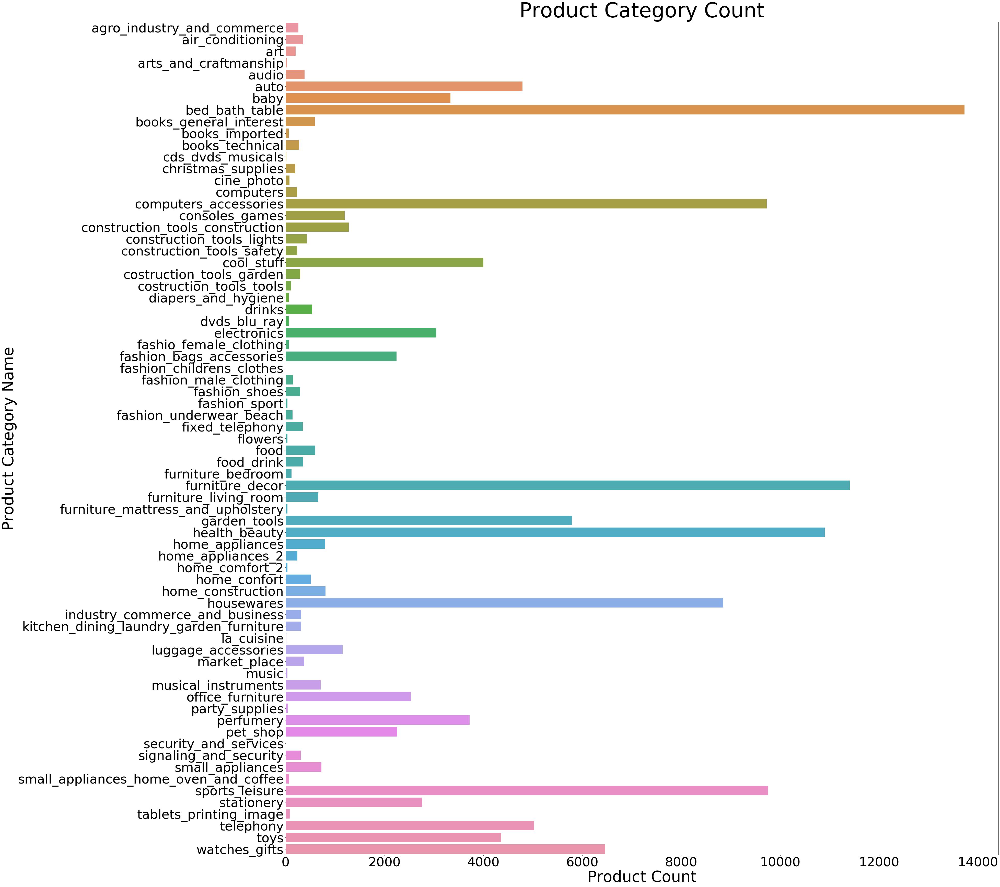

In [158]:
plt.figure(figsize=(50,60))
# orient='v'or'h':vertical or horizontal
sns.barplot(x='item',y='category',data=total_item)
# set the size of font in the ticks
plt.yticks(fontsize=50)
plt.xticks(fontsize=50)
plt.ylabel('Product Category Name',fontsize=60)
plt.xlabel('Product Count',fontsize=60)
plt.title("Product Category Count",fontsize=80)
plt.show()

In [159]:
total_item = olist_data.groupby('category',as_index=False).item.sum()
total_item.head()

,category,item
0,agro_industry_and_commerce,258
1,air_conditioning,353
2,art,202
3,arts_and_craftmanship,26
4,audio,382


In [160]:
olist_community2 = olist_data.loc[(olist_data.seller_zip_code_prefix_3_digits.isin(list1))&
               (olist_data.customer_zip_code_prefix_3_digits.isin(list2))]

In [161]:
total_item_2 = olist_community2.groupby('category',as_index=False).item.sum()
total_item_2.head()

,category,item
0,agro_industry_and_commerce,1
1,art,1
2,audio,2
3,auto,10
4,baby,12


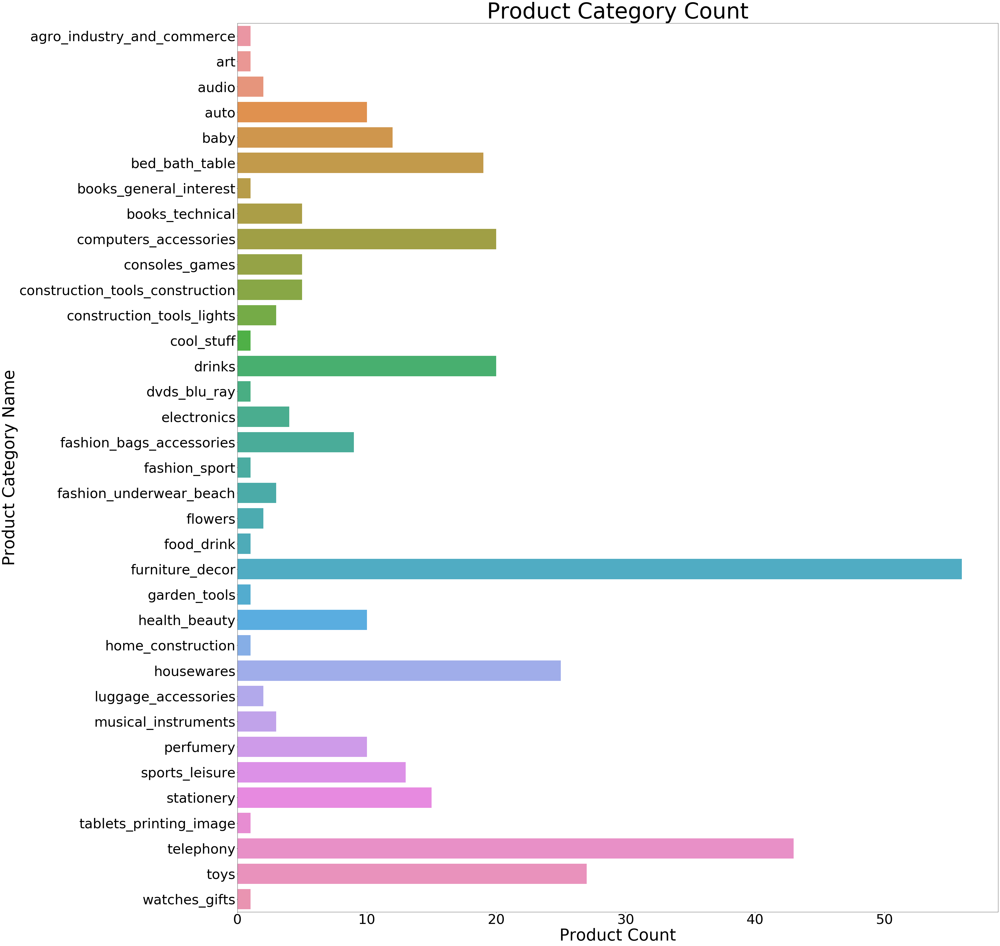

In [162]:
plt.figure(figsize=(50,60))
# orient='v'or'h':vertical or horizontal
sns.barplot(x='item',y='category',data=total_item_2)
# set the size of font in the ticks
plt.yticks(fontsize=50)
plt.xticks(fontsize=50)
plt.ylabel('Product Category Name',fontsize=60)
plt.xlabel('Product Count',fontsize=60)
plt.title("Product Category Count",fontsize=80)
plt.show()

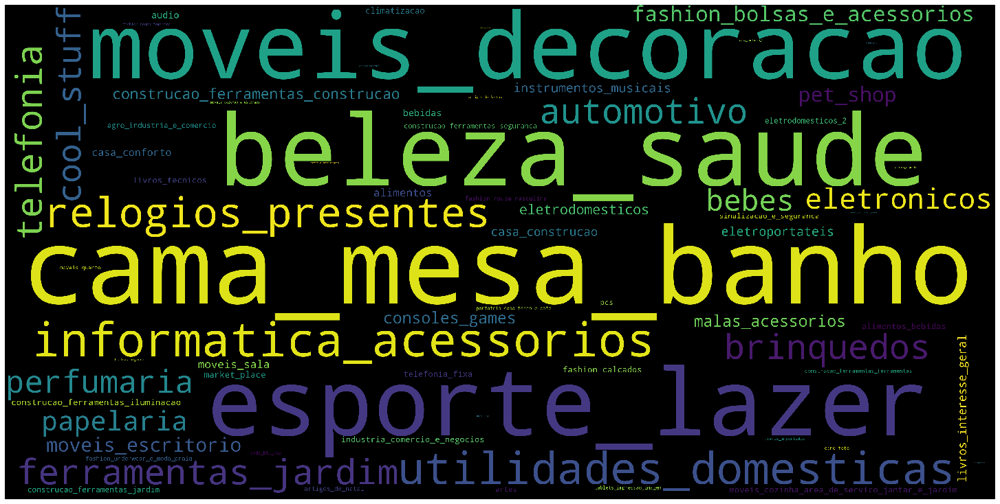

In [163]:
category_words = ' '.join(olist_data.product_category_name.sample(frac=1))
wordcloud = WordCloud(width=5000, height=2500,max_words=300)
wordcloud.generate(category_words)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

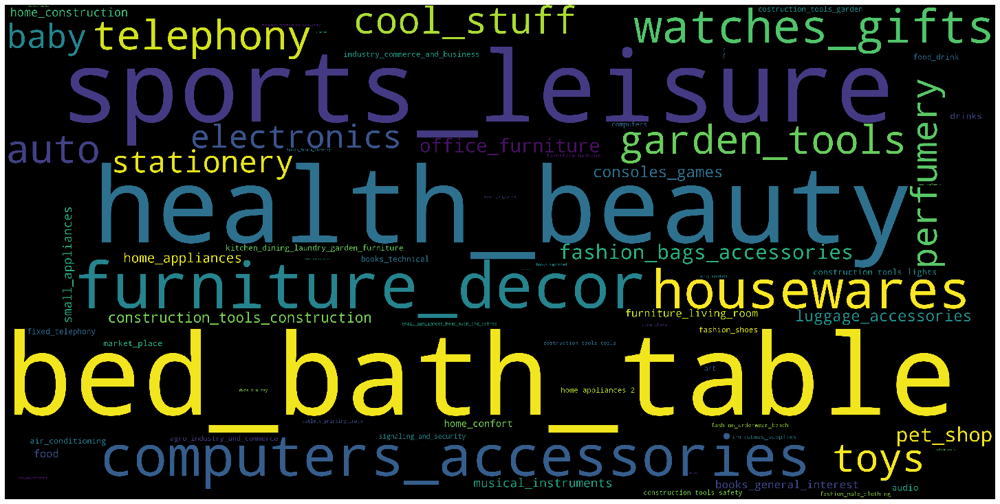

In [164]:
category_words = ' '.join(olist_data.category.sample(frac=1))
wordcloud = WordCloud(width=5000, height=2500,max_words=300)
wordcloud.generate(category_words)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()